In [ ]:
## Import required packages
import numpy as np
import nrrd
import matplotlib.pyplot as plt
import matplotlib as mpl
import skimage

from tqdm.autonotebook import tqdm
from pathlib import Path
import seaborn as sns

import os
import glob

In [ ]:
### Utility functions

# Calculating KDEs takes a very long time
calculate_KDEs = False

## Create a 'specimen ID' -> colour mapping
cmap = {}

# temp_path = r'directory/containing/the/group-scans'
temp_path = r'directory/containing/the/group-scans'
scan_IDs = [x.split('_')[1] for x in os.listdir(temp_path)]

normalized_indices = np.linspace(0, 1, len(scan_IDs))  
for idx, species in enumerate(scan_IDs):
    cmap[species] = mpl.colormaps['tab20'](normalized_indices[idx])  # Use normalized index

cmap = {k: v[:-1] + (0.2, ) for k,v in cmap.items()}

print('Colormap:')
for k, v in cmap.items():
    # cmap[k] = v[:-1] + (1/len(scan_IDs), )
    print(k, end=' ')
    [print(f"{x:.2f}", end=', ') for x in v]
    print('')

#### Check group-scans intensity

In [ ]:
## One-by-one, import a group-scan and generate its histogram and kde

groups_path = r'directory/containing/the/group-scans'

nrrds_paths = glob.glob(os.path.join(groups_path, '*.nrrd'))
nrrd_names = [os.path.basename(x) for x in nrrds_paths]

kde_plots = []

for nrrd_path in tqdm(nrrds_paths):
    scan_ID = os.path.basename(nrrd_path).split('_')[1]
    print(f'{scan_ID} importing...')
    vol, _ = nrrd.read(nrrd_path)
    
    vol = vol.flatten()
    vol = vol[vol > 63]
    bins = np.linspace(64, 255, 256-63)
    plt.hist(vol, bins, color=cmap[scan_ID], label=scan_ID)
    
    if calculate_KDEs:
        print(f'{scan_ID} kde generation')
        temp = sns.kdeplot(vol)
        
        xd, yd = temp.get_lines()[-1].get_data()
        kde_plots.append((scan_ID, xd, yd))

plt.legend()
plt.show()


In [ ]:
## Neatly plot group-scans KDEs

if calculate_KDEs:
    fig, ax = plt.subplots()
    ax.set_ylim(0, 0.13)
    for line in tqdm(kde_plots):
        name, xdata, ydata = line
        color = cmap[name]
        sns.lineplot(x=xdata, y=ydata, color=color, label=name, ax=ax, alpha=0.8)

    ax.legend()
    ax.set_xlabel("Density")
    ax.set_ylabel("Value")

#### Checking specimen intensity

In [ ]:
## Load specimens
specimens_path = Path(r'path/to/Specimens/folder')
nrrds_paths = list(specimens_path.glob('**/*.nrrd'))

specimen_kde_plots = []

specimens = []
for path in tqdm(nrrds_paths, desc='Reading specimens'):
    vol, _ = nrrd.read(path)
    specimens.append((path, vol))
    vol = vol[vol > 63]

    if calculate_KDEs:
        temp = sns.kdeplot(skimage.measure.block_reduce(vol.flatten(), block_size=2, func=np.max, cval=0))
        
        xd, yd = temp.get_lines()[-1].get_data()
        specimen_species = path.parent.name
        specimen_kde_plots.append((specimen_species, xd, yd))
    

In [ ]:
## Plot specimens KDEs

fig, ax = plt.subplots()
ax.set_ylim(0, 0.05)
for line in tqdm(specimen_kde_plots, desc='Plotting results'):
    name, xdata, ydata = line
    color = cmap[f"{name}.nrrd"]
    sns.lineplot(x=xdata, y=ydata, color=color, label=name, ax=ax, alpha=0.3)


# From Fons at https://stackoverflow.com/a/56253636/12618737
def legend_without_duplicate_labels(ax):
    handles, labels = ax.get_legend_handles_labels()
    unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
    ax.legend(*zip(*unique))
legend_without_duplicate_labels(ax)

ax.set_xlabel("Value")
ax.set_ylabel("Density")


#### Specimen segmentation quality checking

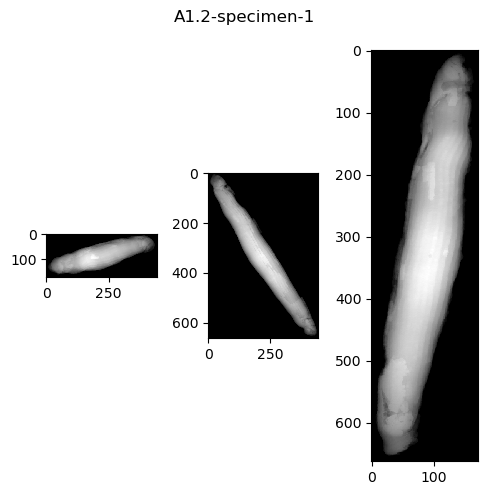

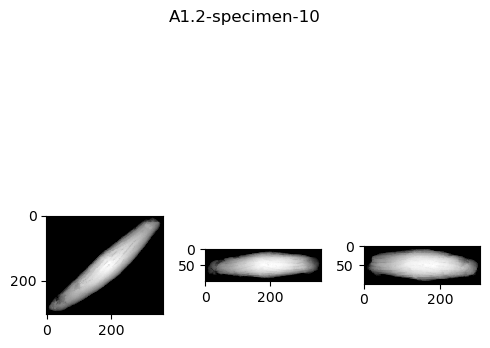

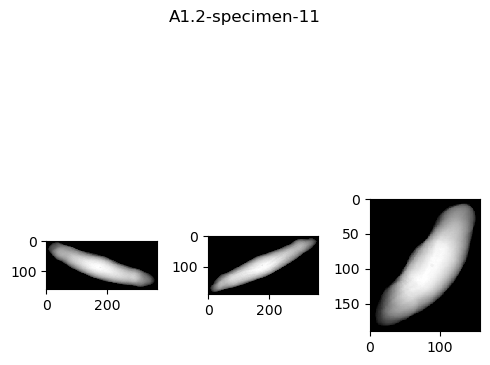

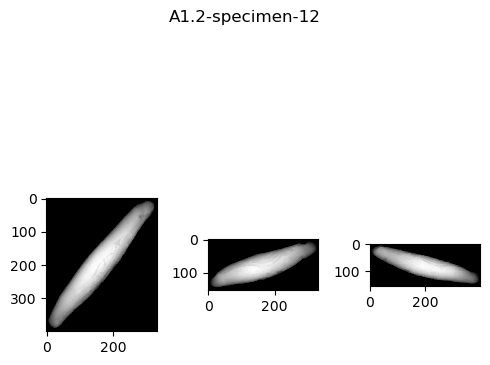

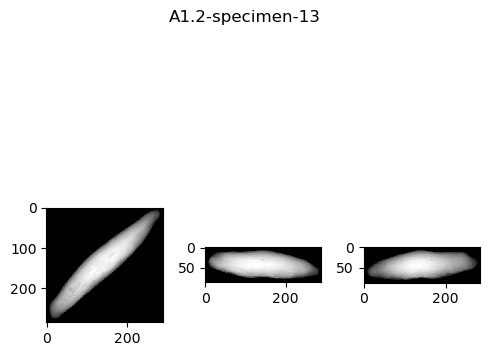

...

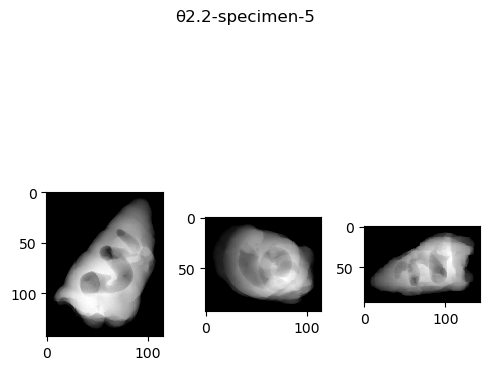

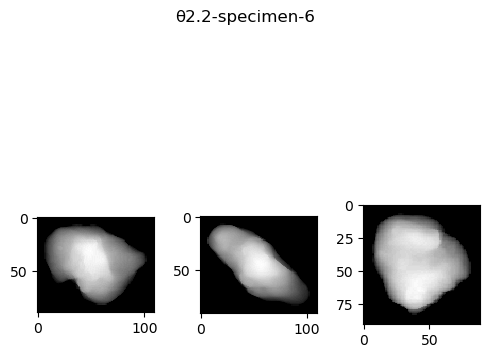

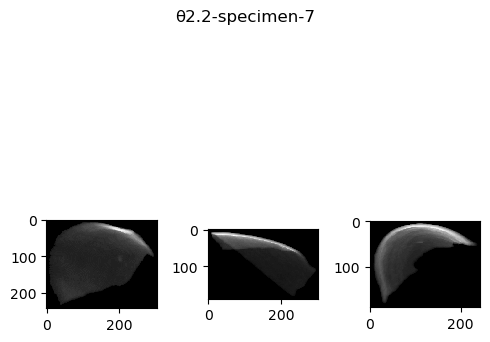

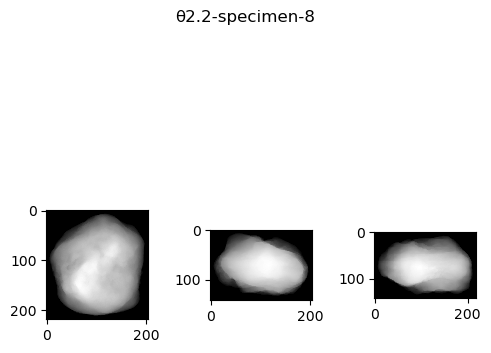

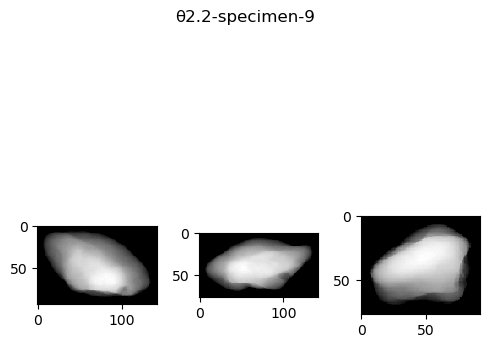

In [8]:
## Analyse specimens

def plot_subvol(vol, title):
    # Create slices of the volume in all 3 dimensions
    slices = [np.sum((vol > 0), axis=-3), np.sum((vol > 0), axis=-2), np.sum((vol > 0), axis=-1)]

    # Plot the slices side-by-side
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(5, 5))
    [ax[i].imshow(slices[i], interpolation='none', cmap='gray') for i in range(3)]

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

[plot_subvol(vol, path.stem) for path, vol in specimens] ;
